In [1]:
import numpy as np
import matplotlib.pyplot as plt
import natsort, glob, h5py
import scipy
from scipy.optimize import curve_fit
import scipy.signal
import pickle
from matplotlib import cm
from scipy.stats import skewnorm

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
# changing the display so that the cells fill the whole window

In [3]:
def gauss_fun(x, A, mu, sig):
    # gaussian function used for single pe fits
    return A * np.exp( -(x-mu)**2/(2*sig**2) )

def lin_fun(x, m, x1):
    # linear function for gain fits
    return m * (x-x1)

def lin_fun_const(x, m):
    # linear function that goes through origin
    return lin_fun(x,m,0)

def norm_fun(x, mu, sig):
    # normal function for normalized source/LED peaks
    return np.exp(-(x-mu)**2/(2*sig**2)) / (sig*np.sqrt(2*np.pi))
    
def poisson_fun(x, A, mu):
    # poisson function for 310 LED peaks
    return A * mu**x * np.exp(-mu) / scipy.special.factorial(x)

def lognorm_fun(x, A, mu, sig):
    # log normal function for 310 LED peaks
    return A * np.exp(-(np.log(x) - mu)**2 / (2*sig**2)) / (x*sig*np.sqrt(2*np.pi))

def skewgauss_fun(x, A, loc, w, alpha):
    # skewed gaussian function for 310 LED peaks
    return A * skewnorm.pdf(x, alpha, loc=loc, scale=alpha)

In [4]:
def rebin_center(hx,h,bins):
    # rebinning the data with the new x values corresponding to the mean of the old?
    h_rebin=[]
    hx_rebin=[]
    for i in range(int(len(h)/bins)):
        start_idx=i*bins
        end_idx=(i+1)*bins
        h_rebin.append(np.sum(h[start_idx:end_idx]))
        hx_rebin.append(np.mean(hx[start_idx:end_idx])) # finding the mean of the x values in the bin
    # hx_rebin=range(len(h_rebin))
    return np.array(hx_rebin), np.array(h_rebin)

In [5]:
def peak_fit_srs10(x_data, y_data, voltage, min_distance=20, max_peaks=5, min_thresh=10, peak_range=500):
    # Find the peaks in the spectrum using the find_peaks function from scipy.signal
    
    peaks_index, _ = scipy.signal.find_peaks(y_data, distance=min_distance)
    
    # Fit each peak with a Gaussian function using the curve_fit function from scipy
    gain_info = [] # parameters to fit the gain
    peak_params = [] # parameters to plot the gaussian
    peak_number = 1 # corresponds to single photoelectron peak
    peaks = [] # list of where all the peaks are that are used in the fits
    peak_cuts = []
    for peak in peaks_index:
        if peak_number > max_peaks: # stopping the loop after we have reached the max number of peaks
            break

        if peak < min_thresh:
            continue
        
        peaks.append(np.array([x_data[peak], y_data[peak]]))
        
        # initial guess for the Gaussian parameters
        amplitude_guess = y_data[peak]
        mean_guess = x_data[peak]
        standard_deviation_guess = 10
        initial_guess = [amplitude_guess, mean_guess, standard_deviation_guess]
        
        # cutting data around each peak
        if peak_number == 1: # trying to not include the pedestal for the first peak
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - 20))
        else:
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - peak_range))
        peak_x = x_data[cut] # x values of peak for fitting
        peak_y = y_data[cut] # y values of peak for fitting
        peak_cuts.append([peak_x, peak_y])
        
#         plt.yscale('log')
#         plt.plot(x_data[cut], y_data[cut], alpha=0.5)
        
        # Perform the curve fitting
        try:
            # trying to fit the peaks
            params, params_covariance = curve_fit(gauss_fun, peak_x, peak_y, p0=initial_guess)
            # params are returned as amplitude, mean, std dev

            peak_params.append(params)
            gain_info.append([peak_number, params[1], np.sqrt(params_covariance[1,1])]) # peak number, mean, and covariance
        except RuntimeError as r:
            # if curve fit doesn't work then we will just use the peak amplitude and center that find_peaks found
            print('fit failed')
            params = initial_guess
            peak_params.append(initial_guess)
            gain_info.append([peak, mean_guess, np.nan])
#             xx = np.linspace( x_data[peak] - 2*standard_deviation_guess, x_data[peak] + 2*standard_deviation_guess, 100 )
        
        peak_number += 1 # (goes to n*spe until it reaches max_peak)
        
    plt.show()
    return np.array(peak_params), np.array(gain_info), np.array(peaks), peak_cuts

In [6]:
def gain_fit_const(pe_locations):
    # fitting a line of the peak centers and heights to get the slope (gain) with dc offset correction already applied
    fpts = ~np.isnan(pe_locations[:,1])
    if(np.sum(fpts) < 3):
        return
    # fitting the peak locations to a line to find the gain (slope)
    gain_bp, gain_bc = curve_fit(lin_fun_const, pe_locations[fpts, 0], pe_locations[fpts, 1])

    x = pe_locations[fpts, 0]
    
    return x, gain_bp, gain_bc

def gain_fit(pe_locations):
    # fitting a line of the peak centers and heights to get the slope (gain) 
    fpts = ~np.isnan(pe_locations[:,1])
    if(np.sum(fpts) < 3):
        return
    # fitting the peak locations to a line to find the gain (slope)
    gain_bp, gain_bc = curve_fit(lin_fun, pe_locations[fpts, 0], pe_locations[fpts, 1])

    x = pe_locations[fpts, 0]
    
    return x, gain_bp, gain_bc

In [7]:
def plot_fit_gain_dc(pe, counts, file_type, peak_dist, SRS_gain):
    # doing the gain calculations and plotting the results (hopefully store this in a separate script at some point)
    gain_vs_volts = {}
    
    if (SRS_gain == 10):
    # setting the peak range for low gain data
        if file_type == 405.0:
            peak_range = 20 # picking a smaller range of values to fit over for the lower OV files

        else:
            peak_range = 25 # picking a smaller range of values to fit over for the lower OV files
    
    if SRS_gain == 10:
        # getting the peak and fit info
#         if file_wavelength == 'source':
        if file_type == 405.0:
            peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(pe, counts, 31.40, min_distance=peak_dist/2, min_thresh=7, peak_range=peak_range)
        else:
            peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(pe, counts, 31.40, min_distance=peak_dist/2, min_thresh=7, peak_range=peak_range)
    
    
    # starting the plots
    plt.figure(figsize=(18,6))
    
    # calculating and plotting the gain 
    plt.subplot(1,2,2)
    plt.errorbar( pe_locs[:,0], pe_locs[:,1], yerr=pe_locs[:,2], fmt='ko' )

    xx, gain_params, gain_cov = gain_fit(pe_locs)
    gain_error = np.sqrt(np.diag(gain_cov))[0]
    plt.plot( xx, lin_fun(xx, *gain_params), 'r', label=r'Gain: %.2f $\pm$ %.2f'%(gain_params[0], gain_error))  #(str(np.round(popt_temp[0],2)))+'$\pm$'+str(np.round(np.sqrt(np.diag(pcov_temp))[0],2))+' ADC/PE'
    plt.legend()
    

    
    # plotting the peaks
    plt.subplot(1,2,1)
    plt.grid()
    plt.ylim(0.1, 8000)
    plt.yscale('log')
    plt.xlim(0.1, 1000)
    
    plt.plot(pe, counts, 'k')
    plt.plot(peaks[:,0], peaks[:,1], 'o', color='r')
    for fit_params, data_peaks in zip(peak_info, data_for_fits):
        plt.plot(pe, gauss_fun(pe, *fit_params))
        plt.plot(data_peaks[0], data_peaks[1])
    plt.show()
    
    return gain_params[0], gain_error, gain_params[1]

In [8]:
def plot_fit_gain(pe, counts, gain, volts, file_type, peak_dist, SRS_gain, dc):
    # doing the gain calculations and plotting the results (hopefully store this in a separate script at some point)
    gain_vs_volts = {}
    
    if (SRS_gain == 10):
    # setting the peak range for low gain data
        if volts < 31.5 and volts >=30.5:
            peak_range = 45 # picking a smaller range of values to fit over for the lower OV files
        elif volts < 30.5:
            print('low voltage range')
            peak_range = 25
        else:
            peak_range = 55 
    
    b = pe
    c = counts
    
    # taking into account dc offset
    b += dc
    # getting the peak and fit info
    if file_type == 'source':
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, volts, min_distance=peak_dist*25/100, min_thresh=17, peak_range=peak_range)
    elif file_type == 405.0:
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, volts, min_distance=peak_dist*25/100, min_thresh=17, peak_range=peak_range, max_peaks=4)
    elif file_type == 310.0:
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, volts, min_distance=peak_dist*25/100, min_thresh=17, peak_range=peak_range, max_peaks=3)
    
    # starting the plots
    plt.figure(figsize=(18,6))
    
    # calculating and plotting the gain 
    plt.subplot(1,2,2)
    plt.errorbar( pe_locs[:,0], pe_locs[:,1], yerr=pe_locs[:,2], fmt='ko' )

    xx, gain_params, gain_cov = gain_fit_const(pe_locs)
    gain_error = np.sqrt(np.diag(gain_cov))[0]
    plt.plot(xx, lin_fun_const(xx, *gain_params), 'r', label=r'Gain: %.2f $\pm$ %.2f'%(gain_params[0], gain_error))  #(str(np.round(popt_temp[0],2)))+'$\pm$'+str(np.round(np.sqrt(np.diag(pcov_temp))[0],2))+' ADC/PE'
    plt.legend()

    calibration_factor = 1/gain_params[0] # setting the first pe to be the fitted gain
    
    # plotting the calibrated peaks
    plt.subplot(1,2,1)
    plt.grid()
    plt.ylim(0.1, 8000)
    plt.yscale('log')
#     plt.ylim(0.1, np.max(mca_hist)*2)
    plt.xlim(0.1, 1000*calibration_factor)
    plt.xticks(np.arange(0, 9, 1))
    
    b = b*calibration_factor
    peaks[:,0] = peaks[:,0]*calibration_factor
    plt.plot(b, c, 'k')
    plt.plot(peaks[:,0], peaks[:,1], 'o', color='r')
    for fit_params, data_peaks in zip(peak_info, data_for_fits):
        fit_params[1] = fit_params[1]*calibration_factor
        fit_params[2] = fit_params[2]*calibration_factor
        plt.plot(b, gauss_fun(b, *fit_params))
        data_peaks[0] = data_peaks[0]*calibration_factor
        plt.plot(data_peaks[0], data_peaks[1])
    plt.show()
    print(gain_error)
    return gain_params[0], gain_error

In [9]:
with open('data_for_pde_20230321.pkl', 'rb') as f: # loading the pde data with the dc offset info
    data = pickle.load(f)

data_NO_FIELD1 = data[0]
data_POS_FIELD1 = data[1]
data_NEG_FIELD = data[2]
data_POS_FIELD2 = data[3]
data_NO_FIELD2 = data[4]
offset_means = data[5]

source


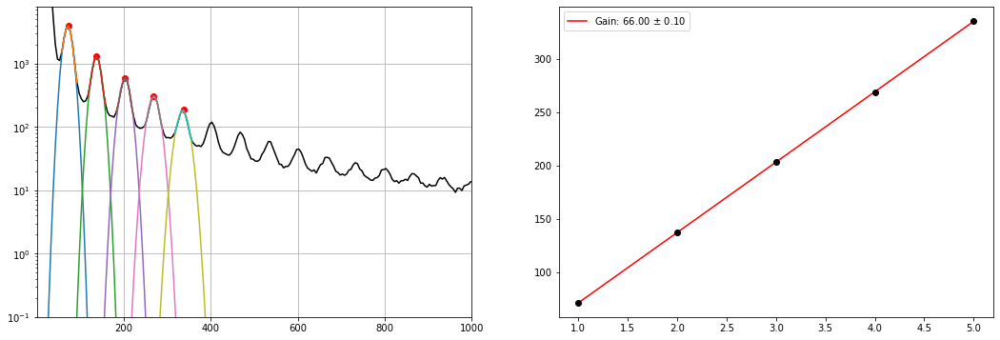

405.0


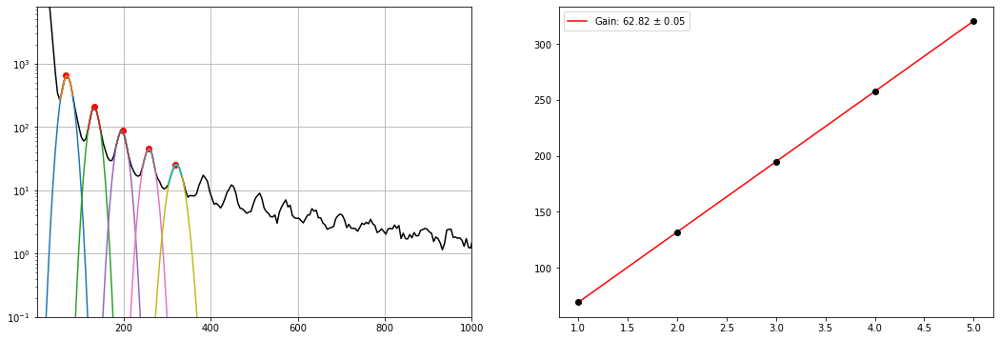

310.0


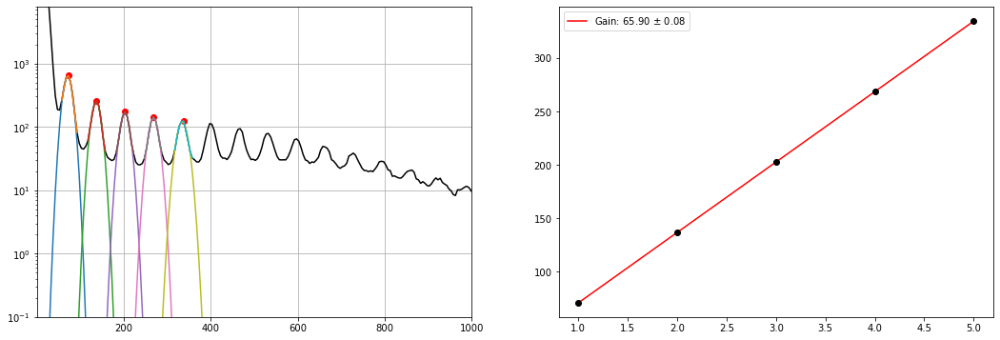

source


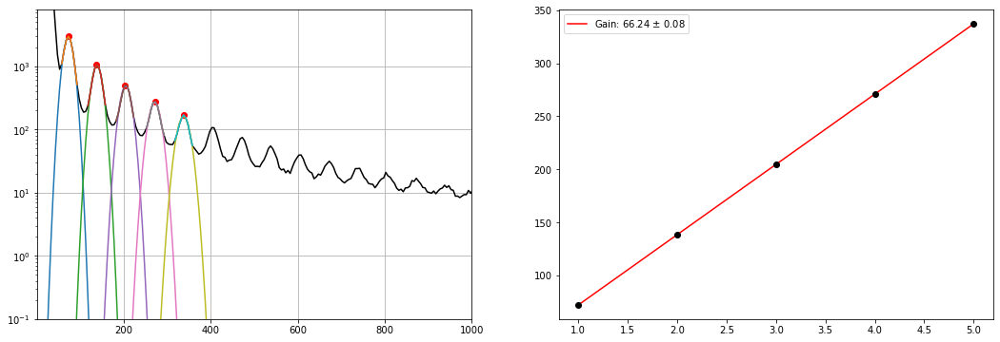

405.0


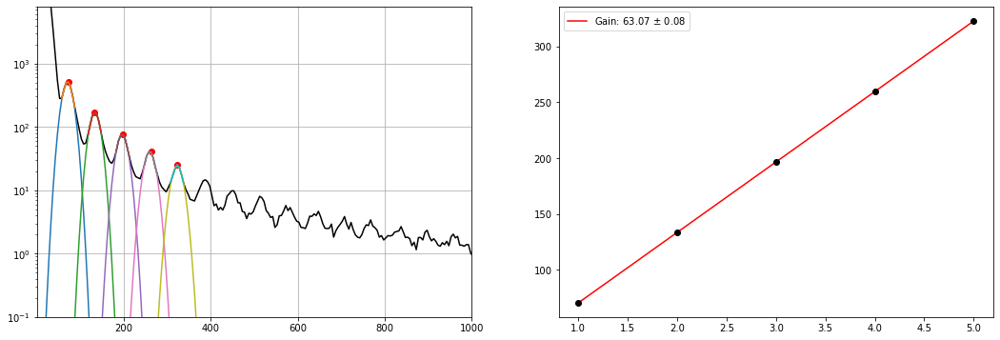

310.0


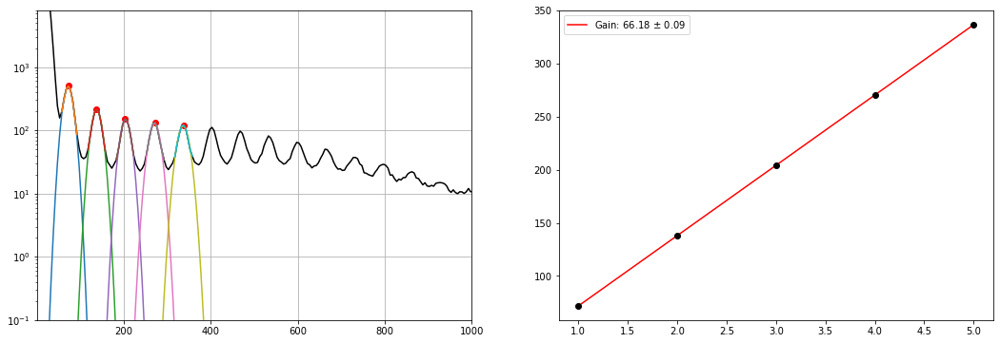

source


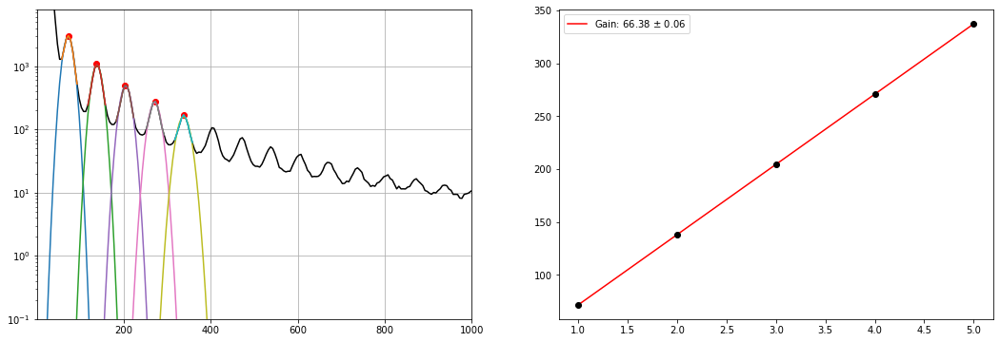

405.0


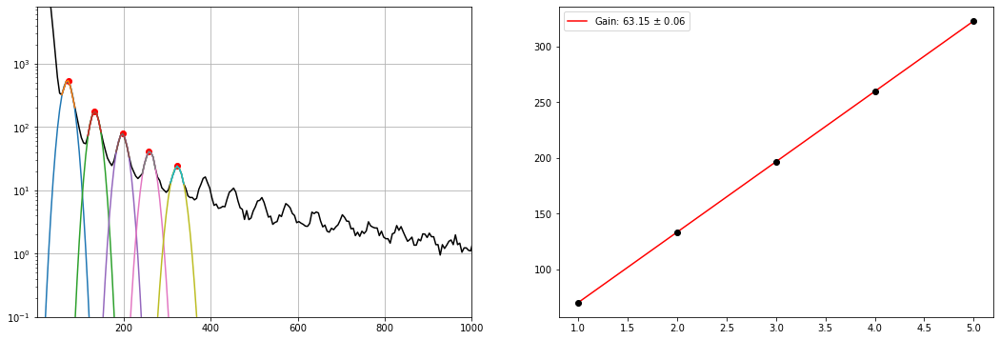

310.0


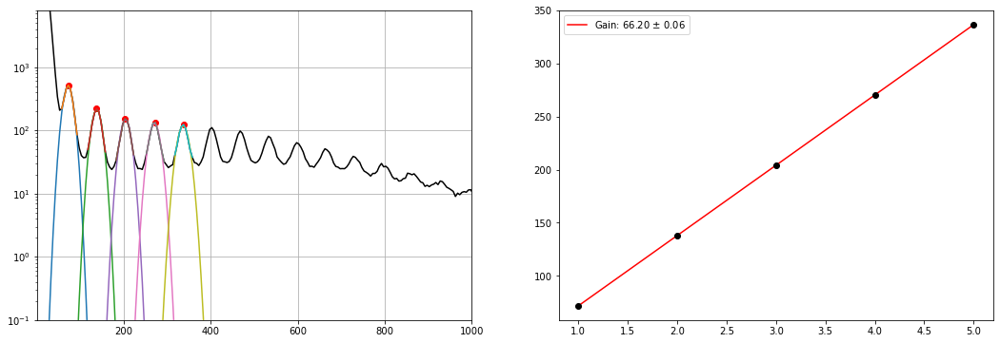

source


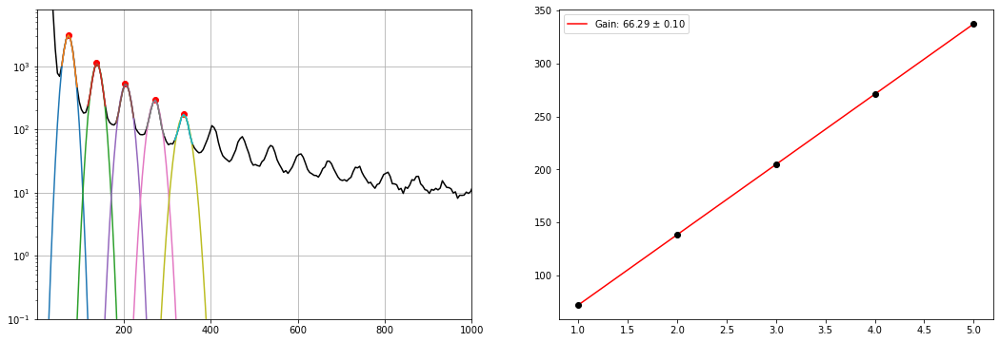

405.0


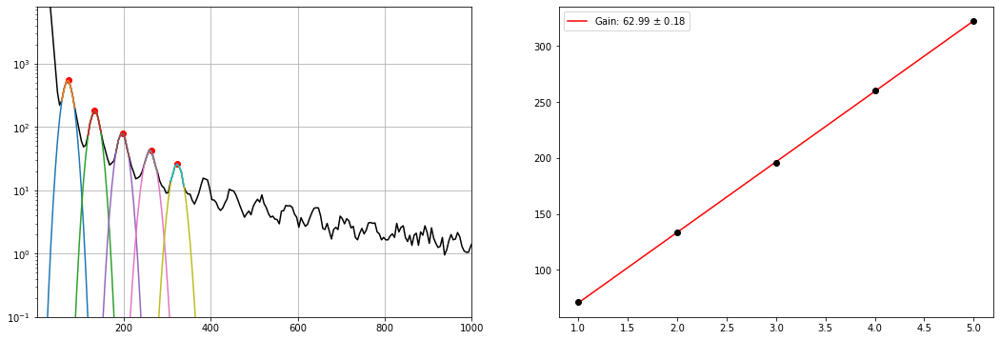

310.0


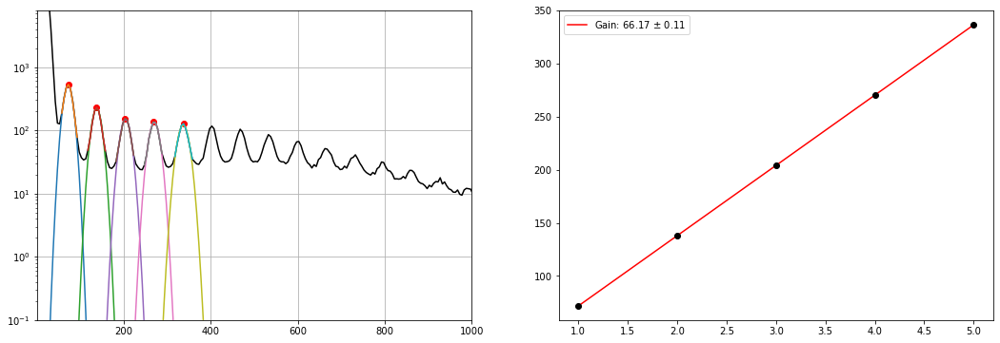

source


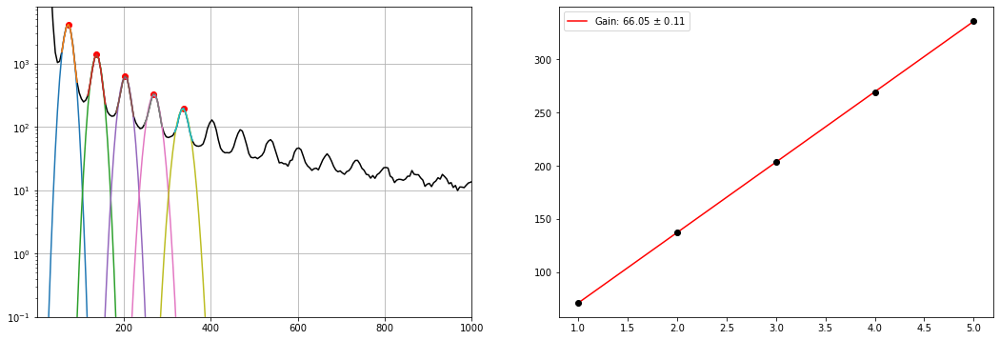

405.0


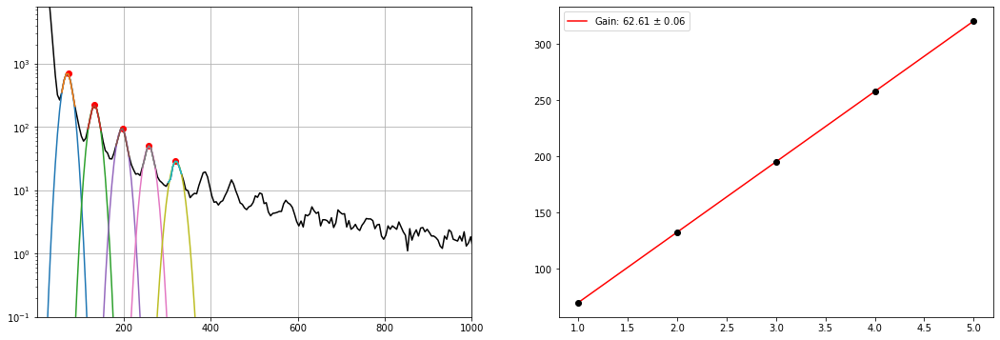

310.0


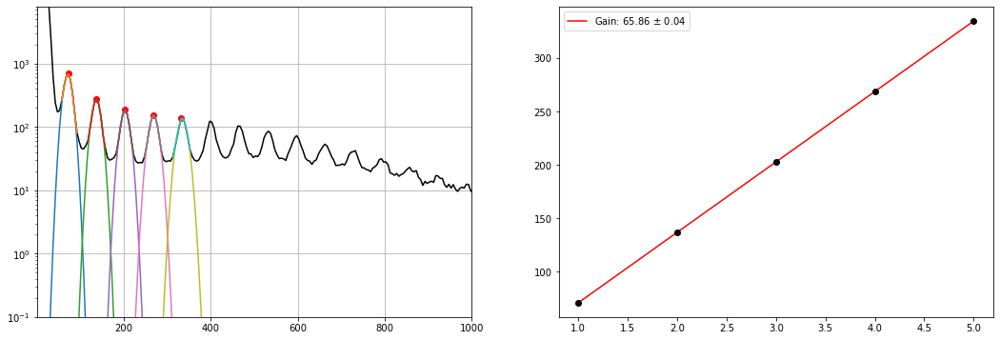

In [10]:
# taking the mean of the raw data before fitting the gain
data_list = [data_NO_FIELD1, data_POS_FIELD1, data_NEG_FIELD, data_POS_FIELD2, data_NO_FIELD2]
new_gains = [{'source': 0, 405.0: 0, 310.0: 0} for data in data_list]
new_dcs = np.empty((len(data_list), 3))
for i, data in enumerate(data_list):
    for j, file_type in enumerate(data):
        data[file_type]['mean_pe'] = np.mean(data[file_type]['pe_data'], axis=0)
        data[file_type]['mean_counts'] = np.mean(data[file_type]['counts'], axis=0)
        print(file_type)
        gain, gain_err, dc = plot_fit_gain_dc(data[file_type]['mean_pe'], data[file_type]['mean_counts'], file_type, 20, 10) # pe, counts, file_type, peak_dist, SRS_gain
        new_gains[i][file_type] = gain
        new_dcs[i][j] = dc

In [11]:
mean_dc = np.mean(new_dcs, axis=0)
mean_dc = np.append(mean_dc, (mean_dc[1], mean_dc[0])) # appending extra mean dcs for the second + and 0 field files in the list of data

In [12]:
def calibrate_data(data_dict, dc_offset, mean_gain=None):
    # calibrating channel data to be in terms of pe using mean gain and dc offset
    
    if mean_gain is None: # if not given a mean gain, calculate it from the list of gains
        for file_type in data_dict:
         # taking the mean of the gains in the data dict to calibrate data
            mean_gain = np.mean(data_dict[file_type]['gain'])
            data_dict[file_type]['pe_data'] = data_dict[file_type]['pe_data']/mean_gain + dc_offset[file_type] # replacing original pe data with the calibrated version

    else: # using mean gain given in the function call to calibrate data
        for file_type in data_dict:
            data_dict[file_type]['pe_data'] = data_dict[file_type]['pe_data']/mean_gain[file_type] + dc_offset[file_type] # replacing original pe data with the calibrated version
            if 'mean_pe' in data_dict[file_type]:
                data_dict[file_type]['mean_pe'] = data_dict[file_type]['mean_pe']/mean_gain[file_type] + dc_offset[file_type] # calibrating mean data


def normalize_data(data_dict, norm_range):
    # normalizing data to the source hump and subtracting the mean source from the LED data before then normalizing the LED humps
    b = {}
    c = {}
    
    min_len = 0
    for file_type in data_dict:
        b[file_type] = data_dict[file_type]['pe_data']
        c[file_type] = data_dict[file_type]['counts']
        
        if file_type == 'source': # taking the mean of the source data to subtract from the LED data
            b['mean_source'] = np.mean(b[file_type], axis=0)
            c['mean_source'] = np.mean(c[file_type], axis=0)
        
        # accounting for the fact that the data might not all be the same length
        # finding shortest array and ignoring the other data points in the longer arrays
        if min_len == 0:
            min_len = len(b[file_type])
        elif min_len > len(b[file_type]):
            min_len = len(b[file_type])
    
    for file_type in b:
        # normalizing with respect to the source hump
        if file_type == 'mean_source':
            gpts = (b[file_type] < norm_range['source'][1]) & (b[file_type] > norm_range['source'][0]) # selecting the points that are part of the mean source hump
            norm_fac = np.trapz(c[file_type][gpts], b[file_type][gpts]) # normalizing the data with respect to the source hump
            mean_ref_hist = c[file_type]/norm_fac # normalizing mean source data

        # normalizing all the source data
        elif file_type == 'source':
            b_use = b[file_type][:min_len]
            c_use = c[file_type][:min_len]
            ref_hist = np.empty(np.shape(c_use))
            for i, (bs, cs) in enumerate(zip(b_use, c_use)):
                gpts = (bs < norm_range['source'][1]) & (bs > norm_range['source'][0]) # selecting the points that are part of the source hump
                norm_fac = np.trapz(cs[gpts], bs[gpts]) # normalizing the data with respect to the source hump
                ref_hist[i] = cs/norm_fac # normalizing source data
            source_dict = {'pe_data': b_use, 'counts': ref_hist}

        # normalizing all the 405 LED data
        elif file_type == 405.0: # normalizing source hump from 310 since the 405 LED hump overlaps the source hump
            b_use = b[file_type][:min_len]
            c_use = c[file_type][:min_len]
            b_310 = b[310.0][:min_len] # using 310 data for the source hump normalization
            c_310 = c[310.0][:min_len]
            norm_hist = np.empty(np.shape(c_use))
            for i, (bs, cs, bs_310, cs_310) in enumerate(zip(b_use, c_use, b_310, c_310)):
                gpts = (bs_310 < norm_range['source'][1]) & (bs_310 > norm_range['source'][0]) # selecting the points that are part of the source hump
                norm_fac = np.trapz(cs_310[gpts], bs_310[gpts]) # normalizing the data with respect to the source hump
                no_source_data = cs/norm_fac - mean_ref_hist
                gpts_led = (bs < norm_range[file_type][1]) & (bs > norm_range[file_type][0]) # selecting points that are part of the LED hump
                norm_fac_led = np.trapz(no_source_data[gpts_led], bs[gpts_led]) # normalizing with respect to LED hump
                norm_hist[i] = no_source_data/norm_fac_led
            _405_dict = {'pe_data': b_use, 'counts': norm_hist}
        
        # normalizing all the 310 LED data
        elif file_type == 310.0:
            b_use = b[file_type][:min_len]
            c_use = c[file_type][:min_len]
            norm_hist = np.empty(np.shape(c_use))
            norm_hist = np.empty(np.shape(c_use))
            for i, (bs, cs) in enumerate(zip(b_use, c_use)):
                gpts = (bs < norm_range['source'][1]) & (bs > norm_range['source'][0]) # selecting the points that are part of the source hump
                norm_fac = np.trapz(cs[gpts], bs[gpts]) # normalizing the data with respect to the source hump
                no_source_data = cs/norm_fac - mean_ref_hist
                gpts_led = (bs < norm_range[file_type][1]) & (bs > norm_range[file_type][0]) # selecting points that are part of the LED hump
                norm_fac_led = np.trapz(no_source_data[gpts_led], bs[gpts_led]) # normalizing with respect to LED hump
                norm_hist[i] = no_source_data/norm_fac_led
            _310_dict = {'pe_data': b_use, 'counts': norm_hist}
    
    normalize_dict = {'source': source_dict, 405.0: _405_dict, 310.0: _310_dict} 
    return normalize_dict

def normalize_mean(mean_data_dict, norm_range):
    # normalizing mean data to the source hump and subtracting the mean source from the LED data
    for file_type in mean_data_dict:
        b = mean_data_dict[file_type]['pe_data']
        c = mean_data_dict[file_type]['counts']

        gpts = (b < norm_range['source'][1]) & (b > norm_range['source'][0]) # selecting the points that are part of the source hump
        norm_fac = np.trapz(c[gpts], b[gpts]) # normalizing the data with respect to the source hump

        if file_type == 'source':
            gpts = (b < norm_range['source'][1]) & (b > norm_range['source'][0]) # selecting the points that are part of the source hump
            norm_fac = np.trapz(c[gpts], b[gpts]) # normalizing the data with respect to the source hump
            ref_hist = c/norm_fac # normalizing source data
            source_dict = {'pe_data': b, 'counts': ref_hist}
        elif file_type == 405.0:
            b_310 = mean_data_dict[310.0]['pe_data'] # using 310 data for the source hump normalization
            c_310 = mean_data_dict[310.0]['counts']
            gpts = (b_310 < norm_range['source'][1]) & (b_310 > norm_range['source'][0]) # selecting the points that are part of the source hump
            norm_fac = np.trapz(c_310[gpts], b_310[gpts]) # normalizing the data with respect to the source hump
            no_source_data = c/norm_fac - ref_hist
            gpts_led = (b < norm_range[file_type][1]) & (b > norm_range[file_type][0]) # selecting points that are part of the LED hump
            norm_fac_led = np.trapz(no_source_data[gpts_led], b[gpts_led]) # normalizing with respect to LED hump
            _405_dict = {'pe_data': b, 'counts': no_source_data/norm_fac_led}
        elif file_type == 310.0:
            gpts = (b < norm_range['source'][1]) & (b > norm_range['source'][0]) # selecting the points that are part of the source hump
            norm_fac = np.trapz(c[gpts], b[gpts]) # normalizing the data with respect to the source hump
            no_source_data = c/norm_fac - ref_hist
            gpts_led = (b < norm_range[file_type][1]) & (b > norm_range[file_type][0]) # selecting points that are part of the LED hump
            norm_fac_led = np.trapz(no_source_data[gpts_led], b[gpts_led]) # normalizing with respect to LED hump
            _310_dict = {'pe_data': b, 'counts': no_source_data/norm_fac_led}

    normalize_dict = {'source': source_dict, 405.0: _405_dict, 310.0: _310_dict}
    return normalize_dict

# Post Calibration Analysis

In [13]:
# calibrating all the data
for field_data, offset, mean_gain in zip([data_NO_FIELD1, data_POS_FIELD1, data_NEG_FIELD, data_POS_FIELD2, data_NO_FIELD2], mean_dc, new_gains):
    calibrate_data(field_data, offset_means, mean_gain)

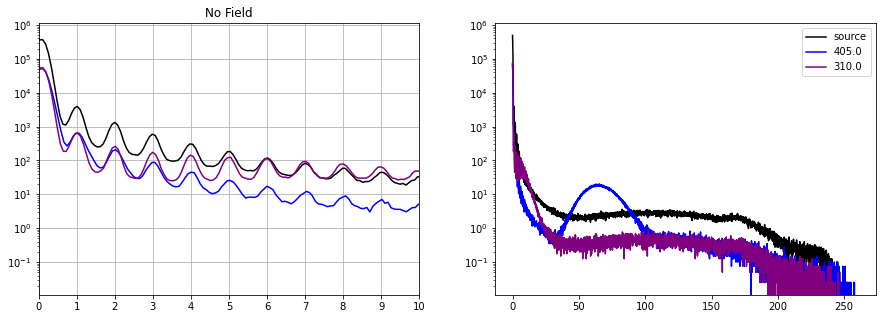

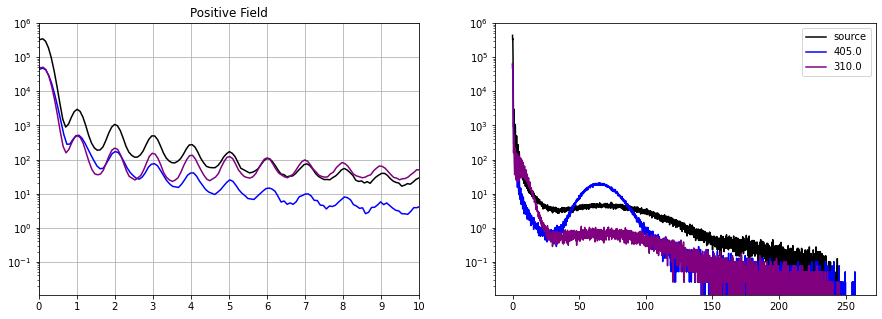

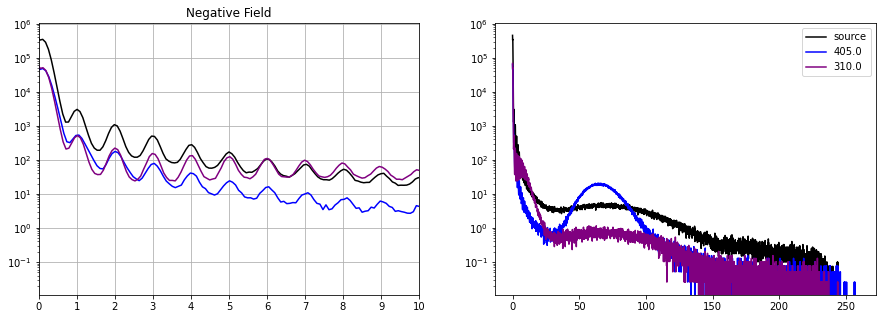

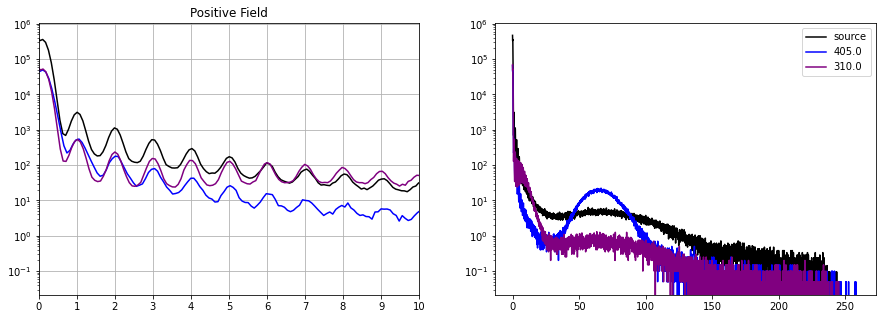

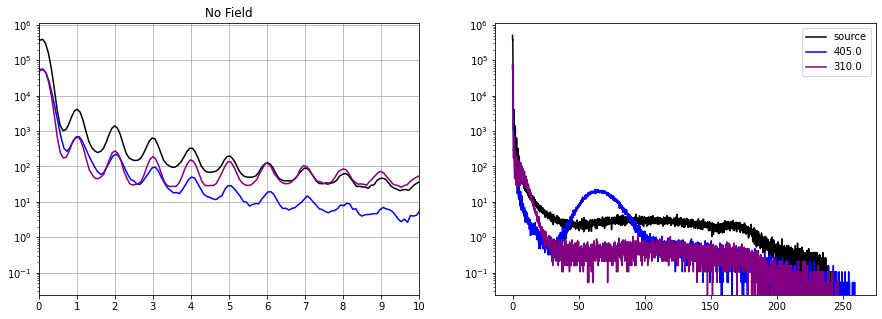

In [14]:
mean_data_no1 = {'source':{}, 405.0:{}, 310.0:{}}
mean_data_pos1 = {'source':{}, 405.0:{}, 310.0:{}}
mean_data_neg = {'source':{}, 405.0:{}, 310.0:{}}
mean_data_pos2 = {'source':{}, 405.0:{}, 310.0:{}}
mean_data_no2 = {'source':{}, 405.0:{}, 310.0:{}}

data_list = [data_NO_FIELD1, data_POS_FIELD1, data_NEG_FIELD, data_POS_FIELD2, data_NO_FIELD2]
field_list = ['No', 'Positive', 'Negative', 'Positive', 'No']
mean_data_list = [mean_data_no1, mean_data_pos1, mean_data_neg, mean_data_pos2, mean_data_no2]


# plotting all of the peaks
for field_data, label, mean_data in zip(data_list, field_list, mean_data_list):
    plt.figure(figsize=(15,5))
    for file_type in field_data:
        
        # plot zoomed into the single pes
        plt.subplot(1,2,1)
        plt.grid()
        plt.title('{} Field'.format(label))
        plt.yscale('log')
        plt.xlim(0, 10)
        plt.xticks(np.arange(0, 11, 1))
        mean_data[file_type]['pe_data'] = np.mean(field_data[file_type]['pe_data'], axis=0)
        mean_data[file_type]['counts'] = np.mean(field_data[file_type]['counts'], axis=0)
        plt.plot(mean_data[file_type]['pe_data'], mean_data[file_type]['counts'], color=field_data[file_type]['color'], label=file_type)
        
        # plot showing the entire histogram
        plt.subplot(1,2,2)
        plt.yscale('log')
        plt.plot(mean_data[file_type]['pe_data'], mean_data[file_type]['counts'], color=field_data[file_type]['color'], label=file_type)

    plt.legend()

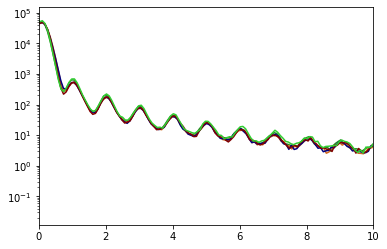

In [15]:
field_colors = ['forestgreen', 'chocolate', 'navy',  'maroon', 'limegreen']
plt.figure()
for data, color in zip(mean_data_list, field_colors):
    plt.plot(data[405.0]['pe_data'], data[405.0]['counts'], c=color)
    plt.yscale('log')
    plt.xlim(0, 10)

In [16]:
norm_range = {'source': [30, 100], 405.0: [30, 100], 310.0: [0.5, 20]}
norm_range_0 = {'source': [50, 150], 405.0: [30, 100], 310.0: [0.5, 20]}

norm_data = []
# normalizing data for each field
for field_data, norm in zip(data_list, [norm_range_0, norm_range, norm_range, norm_range, norm_range_0]):
    norm_data.append(normalize_data(field_data, norm))

mean_norm_data = []
# normalizing mean data for each field
for field_data, norm in zip(mean_data_list, [norm_range_0, norm_range, norm_range, norm_range, norm_range_0]):
    mean_norm_data.append(normalize_mean(field_data, norm))

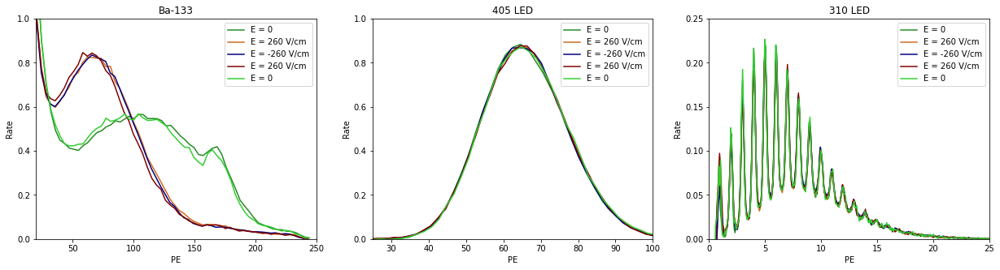

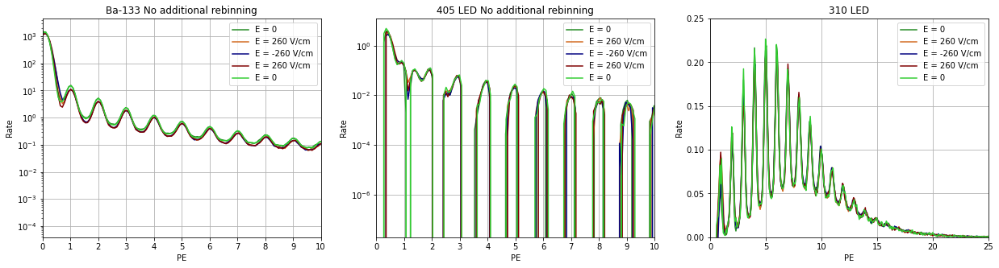

In [17]:
field_colors = ['forestgreen', 'chocolate', 'navy',  'maroon', 'limegreen']#['brown', 'darkcyan', 'goldenrod'] #
field_labels = ['0', '260 V/cm', '-260 V/cm', '260 V/cm','0']
plt.figure(figsize=(21, 5))
for field, color, label in zip(mean_norm_data, field_colors, field_labels):
    
    # plotting mean source data for all fields
    plt.subplot(1,3,1)
    rebin_x, rebin_y = rebin_center(field['source']['pe_data'], field['source']['counts'], 50)
    plt.plot(rebin_x, rebin_y, c=color, label='E = {}'.format(label))
    plt.title('Ba-133')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 1)
    plt.xlim(20, 250)
    plt.legend()
    
    # plotting mean 405 data for all fields
    plt.subplot(1,3,2)
    rebin_x_L, rebin_y_L = rebin_center(field[405.0]['pe_data'], field[405.0]['counts'], 25)
    plt.plot(rebin_x_L, rebin_y_L, c=color, label='E = {}'.format(label))
    plt.title('405 LED')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 1)
    plt.xlim(25,100)
    plt.legend()
    
    # plotting mean 310 data for all fields
    plt.subplot(1,3,3)
    plt.plot(field[310.0]['pe_data'], field[310.0]['counts'], c=color, label='E = {}'.format(label))
    plt.title('310 LED')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 0.25)
    plt.xlim(0, 25)
    plt.legend()

plt.figure(figsize=(21, 5))
for field, color, label in zip(mean_norm_data, field_colors, field_labels):
    
    # plotting zoomed in source single pes for all fields
    plt.subplot(1,3,1)
    plt.grid()
    plt.plot(field['source']['pe_data'], field['source']['counts'], c=color, label='E = {}'.format(label))
    plt.title('Ba-133 No additional rebinning')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.yscale('log')
    plt.xlim(0, 10)
    plt.xticks(np.arange(0, 11, 1))
    plt.legend()
    
    # plotting zoomed in 405 single pes for all fields
    plt.subplot(1,3,2)
    plt.grid()
    plt.plot(field[405.0]['pe_data'], field[405.0]['counts'], c=color, label='E = {}'.format(label))
    plt.title('405 LED No additional rebinning')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.yscale('log')
    plt.xlim(0,10)
    plt.xticks(np.arange(0, 11, 1))
    plt.legend()
    
    # plotting zoomed in 310 single pes for all fields
    plt.subplot(1,3,3)
    plt.grid()
    plt.plot(field[310.0]['pe_data'], field[310.0]['counts'], c=color, label='E = {}'.format(label))
    plt.title('310 LED')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 0.25)
    plt.xlim(0, 25)
    plt.legend()

In [18]:
# rounding the pe values and then summing all the counts in each new pe "bin" for the mean data
for field in mean_norm_data:
    rounded_pe = np.round(field[310.0]['pe_data']) # rounding all of the 310 pe data to discretize the hump
    unique_pe = np.unique(rounded_pe) # finding the unique pe vals
    rounded_counts = []
    for pe in unique_pe: # summing all of the counts data that belongs in each rounded pe bin
        indices = np.where(rounded_pe == pe) # finding all indices where the rounded pe data is each number
        sum_count = np.sum(field[310.0]['counts'][indices]) # summing all of the counts data with the specified indices
        rounded_counts.append(sum_count)
    field[310.0]['mean_rounded_pe'] = unique_pe
    field[310.0]['mean_rounded_counts'] = np.asarray(rounded_counts)

In [19]:
# doing the same dicretization for all data
for field in norm_data: 
    rounded_pe = np.round(field[310.0]['pe_data']) # rounding all of the 310 pe data to discretize the hump
    field[310.0]['rounded_pe'] = []
    field[310.0]['rounded_counts'] = []
    
    for i in range(rounded_pe.shape[0]): # iterating through each file in the field data
        unique_pe = np.unique(rounded_pe[i]) # finding the unique pe vals
        rounded_counts = []
        
        for pe in unique_pe: # summing all of the counts data that belongs in each rounded pe bin
            indices = np.where(rounded_pe[i] == pe) # finding all indices where the rounded pe data is each number
            sum_count = np.sum(field[310.0]['counts'][i][indices]) # summing all of the counts data with the specified indices
            rounded_counts.append(sum_count)
        field[310.0]['rounded_pe'].append(unique_pe)
        field[310.0]['rounded_counts'].append(np.asarray(rounded_counts))
    field[310.0]['rounded_pe'] = np.asarray(field[310.0]['rounded_pe'])
    field[310.0]['rounded_counts'] = np.asarray(field[310.0]['rounded_counts'])

In [20]:
rebin_norm_data = []

# rebinning data in each field in order to perform peak fits
for field in norm_data:
    rebin_dict = {'source': {}, 405.0: {}, 310.0: {}}
    for file_type in field:
        if file_type == 310.0: # using the rounded data for the 310 peak
            rebin_dict[file_type]['pe_data'] = field[file_type]['rounded_pe']
            rebin_dict[file_type]['counts'] = field[file_type]['rounded_counts']
        else:
            if file_type == 'source':
                bins = 25 # rebinning source data using a 25 binsize
            elif file_type == 405.0:
                bins = 25 # rebinning 405 data using a 25 binsize
            for pe, count in zip(field[file_type]['pe_data'], field[file_type]['counts']):
                x, y = rebin_center(pe, count, bins) # for each file (row) of data, rebin the counts and pes
                if 'pe_data' not in rebin_dict[file_type].keys(): # if the rebin_dict doesn't have lists in the file type defined, create them
                    rebin_dict[file_type]['pe_data'] = [x]
                    rebin_dict[file_type]['counts'] = [y]
                else:
                    rebin_dict[file_type]['pe_data'].append(x) # append the newly rebinned data to the rebinned lists
                    rebin_dict[file_type]['counts'].append(y)
            rebin_dict[file_type]['pe_data'] = np.asarray(rebin_dict[file_type]['pe_data']) # converting lists to arrays
            rebin_dict[file_type]['counts'] = np.asarray(rebin_dict[file_type]['counts'])
    
    rebin_norm_data.append(rebin_dict)

In [21]:
def norm_LED(mean_data_dict, norm_range):
    # normalizing with respect to LED hump only
    for file_type in mean_data_dict:
        if file_type == 'source': # selecting for the LED data
            pass
        b = mean_data_dict[file_type]['pe_data']
        c = mean_data_dict[file_type]['counts']

        if file_type == 405.0:
            gpts_led = (b < norm_range[file_type][1]) & (b > norm_range[file_type][0]) # selecting points that are part of the LED hump
            norm_fac_led = np.trapz(c[gpts_led], b[gpts_led]) # normalizing with respect to LED hump
            _405_dict = {'pe_data': b, 'counts': c/norm_fac_led}
        elif file_type == 310.0:
            gpts_led = (b < norm_range[file_type][1]) & (b > norm_range[file_type][0]) # selecting points that are part of the LED hump
            norm_fac_led = np.trapz(c[gpts_led], b[gpts_led]) # normalizing with respect to LED hump
            _310_dict = {'pe_data': b, 'counts': c/norm_fac_led}

    normalize_dict = {405.0: _405_dict, 310.0: _310_dict}
    return normalize_dict

In [22]:
mean_norm_LED = []
for field_data, norm in zip(mean_data_list, [norm_range_0, norm_range, norm_range, norm_range, norm_range_0]):
    mean_norm_LED.append(norm_LED(field_data, norm))

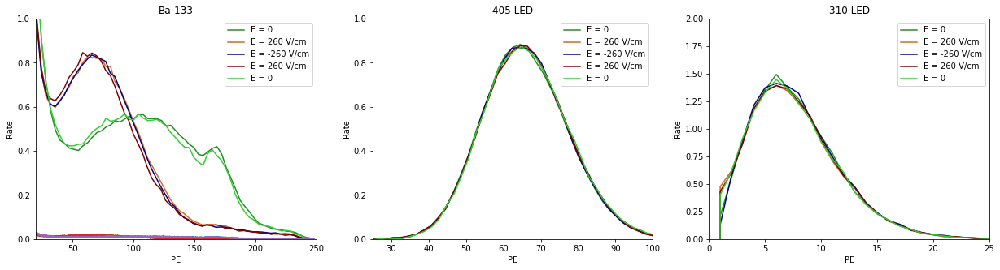

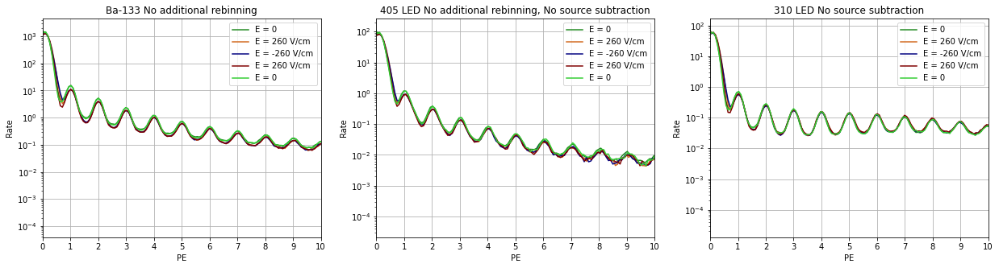

In [23]:
field_colors = ['forestgreen', 'chocolate', 'navy',  'maroon', 'limegreen']
field_labels = ['0', '260 V/cm', '-260 V/cm', '260 V/cm','0']
plt.figure(figsize=(21, 5))
for field, color, label in zip(mean_norm_data, field_colors, field_labels):
    
    # plotting mean normalized source data
    plt.subplot(1,3,1)
    rebin_x, rebin_y = rebin_center(field['source']['pe_data'], field['source']['counts'], 50)
    plt.plot(rebin_x, rebin_y, c=color, label='E = {}'.format(label))
    plt.plot(field['source']['pe_data'], field['source']['counts'])
    plt.title('Ba-133')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 1)
    plt.xlim(20, 250)
    plt.legend()
    
    # plotting mean normalized 405 data
    plt.subplot(1,3,2)
    rebin_x_L, rebin_y_L = rebin_center(field[405.0]['pe_data'], field[405.0]['counts'], 25)
    plt.plot(rebin_x_L, rebin_y_L, c=color, label='E = {}'.format(label))
    plt.title('405 LED')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 1)
    plt.xlim(25,100)
    plt.legend()
    
    # plotting mean rounded 310 data
    plt.subplot(1,3,3)
    plt.plot(field[310.0]['mean_rounded_pe'], field[310.0]['mean_rounded_counts'], c=color, label='E = {}'.format(label))
    plt.title('310 LED')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 2)
    plt.xlim(0, 25)
    plt.legend()

plt.figure(figsize=(21, 5))
for led_norm, field, color, label in zip(mean_norm_LED, mean_norm_data, field_colors, field_labels):
    
    # plotting zoomed in single pes for source data
    plt.subplot(1,3,1)
    plt.grid()
    plt.plot(field['source']['pe_data'], field['source']['counts'], c=color, label='E = {}'.format(label))
    plt.title('Ba-133 No additional rebinning')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.yscale('log')
    plt.xlim(0, 10)
    plt.xticks(np.arange(0, 11, 1))
    plt.legend()
    
    # plotting zoomed in single pes of 405 data without source subtraction
    plt.subplot(1,3,2)
    plt.grid()
    plt.plot(led_norm[405.0]['pe_data'], led_norm[405.0]['counts'], c=color, label='E = {}'.format(label))
    plt.title('405 LED No additional rebinning, No source subtraction')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.yscale('log')
    plt.xlim(0,10)
    plt.xticks(np.arange(0, 11, 1))
    plt.legend()
    
    # plotting zoomed in single pes of 310 data without source subtraction
    plt.subplot(1,3,3)
    plt.grid()
    plt.plot(led_norm[310.0]['pe_data'], led_norm[310.0]['counts'], c=color, label='E = {}'.format(label))
    plt.title('310 LED No source subtraction')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.yscale('log')
    plt.xlim(0, 10)
    plt.xticks(np.arange(0, 11, 1))
    plt.legend()
    

# Time Fits

In [24]:
# def mean_pde_fit(data_dict, peak_range):
    # fitting the source and LED peaks using normalized, rebinned data

In [25]:
def pde_fit(data_dict, peak_range):
    # fitting the source and LED peaks using normalized, rebinned data
    params_dict = {'source': [], 405.0: [], 310.0: []}
    std_dev_dict = {'source': [], 405.0: [], 310.0: []}
    for file_type in data_dict:
        if file_type == 'source':
            params_dict[file_type] = np.empty((len(data_dict[file_type]['pe_data']), 3))
            std_dev_dict[file_type] = np.empty((len(data_dict[file_type]['pe_data']), 1))
            for i, (b, c) in enumerate(zip(data_dict[file_type]['pe_data'], data_dict[file_type]['counts'])):
                gpts = (b < peak_range[file_type][1]) & (b > peak_range[file_type][0])
                peak_x = b[gpts]
                peak_y = c[gpts]
                
                amp_guess = np.max(peak_y)
                mean_guess = 100
                std_guess = 70
                initial_guess = [amp_guess, mean_guess, std_guess]
#                 params = initial_guess
#                 plt.figure()
#                 plt.plot(peak_x, peak_y)
#                 plt.plot(peak_x, gauss_fun(peak_x, *initial_guess))
                params, params_cov = curve_fit(gauss_fun, peak_x, peak_y, p0=initial_guess)
                params_dict[file_type][i] = params
                std_dev_dict[file_type][i] = np.sqrt(np.diag(params_cov))[0]
            
        elif file_type == 405.0:
            params_dict[file_type] = np.empty((len(data_dict[file_type]['pe_data']), 3))
            std_dev_dict[file_type] = np.empty((len(data_dict[file_type]['pe_data']), 1))
            for i, (b, c) in enumerate(zip(data_dict[file_type]['pe_data'], data_dict[file_type]['counts'])):
                gpts = (b < peak_range[file_type][1]) & (b > peak_range[file_type][0])
                peak_x = b[gpts]
                peak_y = c[gpts]
                
                amp_guess = np.max(peak_y)
                mean_guess = 65
                std_guess = 100
                initial_guess = [amp_guess, mean_guess, std_guess]
                params, params_cov = curve_fit(gauss_fun, peak_x, peak_y, p0=initial_guess)
                params_dict[file_type][i] = params
                std_dev_dict[file_type][i] = np.sqrt(np.diag(params_cov))[0]
            
        elif file_type == 310.0:
            params_dict[file_type] = np.empty((len(data_dict[file_type]['pe_data']), 3))
            std_dev_dict[file_type] = np.empty((len(data_dict[file_type]['pe_data']), 1))
            for i, (b, c) in enumerate(zip(data_dict[file_type]['pe_data'], data_dict[file_type]['counts'])):
                gpts = (b < peak_range[file_type][1]) & (b > peak_range[file_type][0])
                peak_x = b[gpts]
                peak_y = c[gpts]
                
                amp_guess = np.max(peak_y)
                mean_guess = 5
                scale_guess = 2
                shape_guess = 4
#                 std_guess = 1
                initial_guess = [amp_guess, mean_guess, std_guess]#, scale_guess, shape_guess]
#                 params, params_cov = curve_fit(skewgauss_fun, peak_x, peak_y, p0=initial_guess)
                params, params_cov = curve_fit(lognorm_fun, peak_x, peak_y, p0=initial_guess)
#                 params, params_cov = curve_fit(poisson_fun, peak_x, peak_y, p0=initial_guess)
                params_dict[file_type][i] = params
                std_dev_dict[file_type][i] = np.sqrt(np.diag(params_cov))[0]
    return params_dict, std_dev_dict

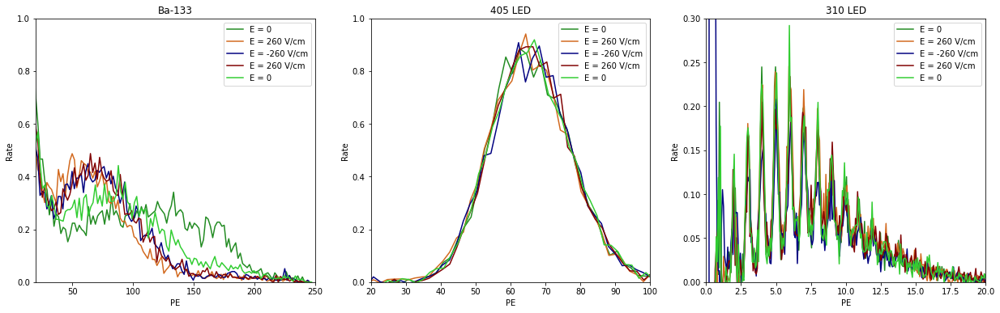

In [26]:
plt.figure(figsize=(21, 6))
for field, color, label in zip(norm_data, field_colors, field_labels):
    
    # plotting the normalized source data
    plt.subplot(1,3,1)
    rebin_x, rebin_y = rebin_center(field['source']['pe_data'][0], field['source']['counts'][0], 25)
    plt.plot(rebin_x, rebin_y, c=color, label='E = {}'.format(label))
    plt.title('Ba-133')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 1)
    plt.xlim(20, 250)
    plt.legend()
    
    # plotting the normalized 405 data
    plt.subplot(1,3,2)
    rebin_x_L, rebin_y_L = rebin_center(field[405.0]['pe_data'][0], field[405.0]['counts'][0], 25)
    plt.plot(rebin_x_L, rebin_y_L, c=color, label='E = {}'.format(label))
    plt.title('405 LED')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 1)
    plt.xlim(20,100)
    plt.legend()
    
    # plotting the normalized 310 data
    plt.subplot(1,3,3)
    plt.plot(field[310.0]['pe_data'][0], field[310.0]['counts'][0], c=color, label='E = {}'.format(label))
    plt.title('310 LED')
    plt.ylabel('Rate')
    plt.xlabel('PE')
    plt.ylim(0, 0.3)
    plt.xlim(0,20)
    plt.legend()

In [27]:
fit_range = {'source': [30, 250], 405.0: [30, 100], 310.0: [1, 20]}
fit_range_0 = {'source': [50, 250], 405.0: [30, 100], 310.0: [1, 20]}

In [28]:
fit_params = []
fit_stddevs = []
for field, peak_range in zip(rebin_norm_data, [fit_range_0, fit_range, fit_range, fit_range, fit_range_0]):
    params, stddevs = pde_fit(field, peak_range)
    fit_params.append(params)
    fit_stddevs.append(stddevs)

/gpfs/gibbs/project/david_moore/sw979/conda_envs/py37s/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


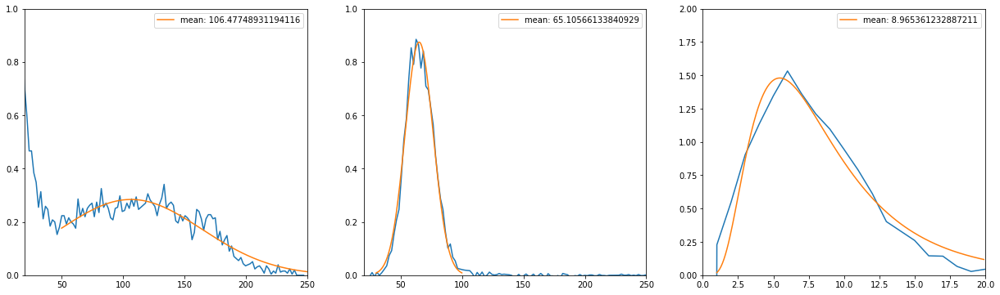

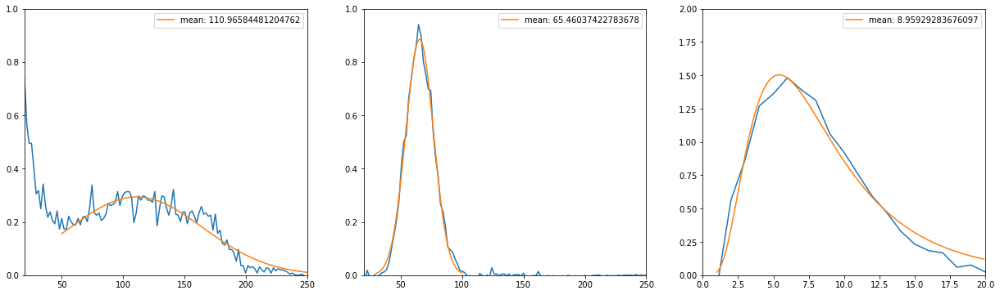

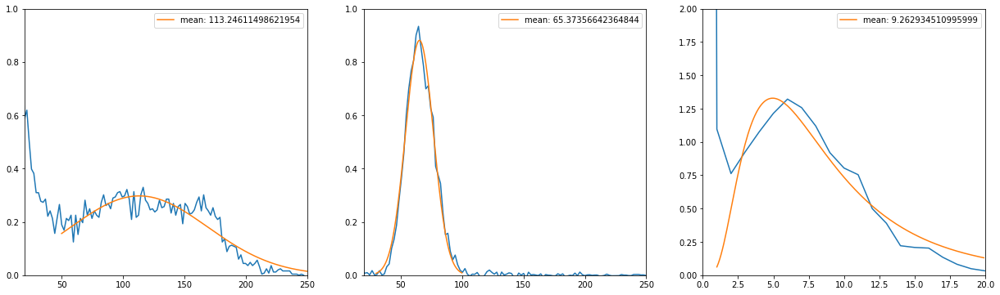

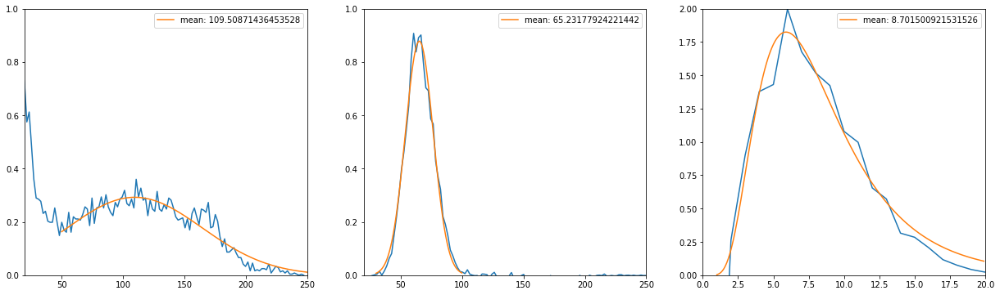

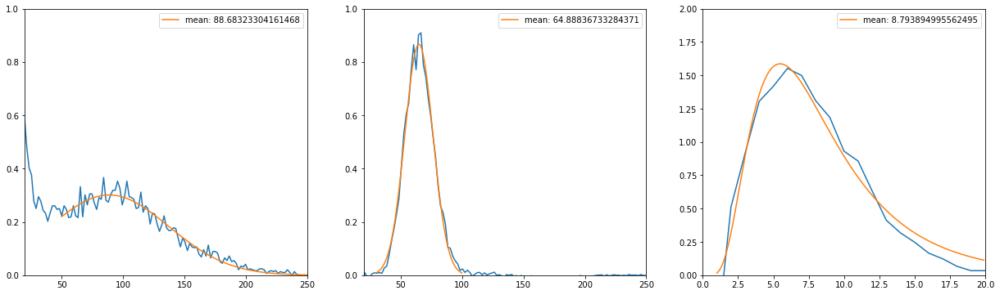

...

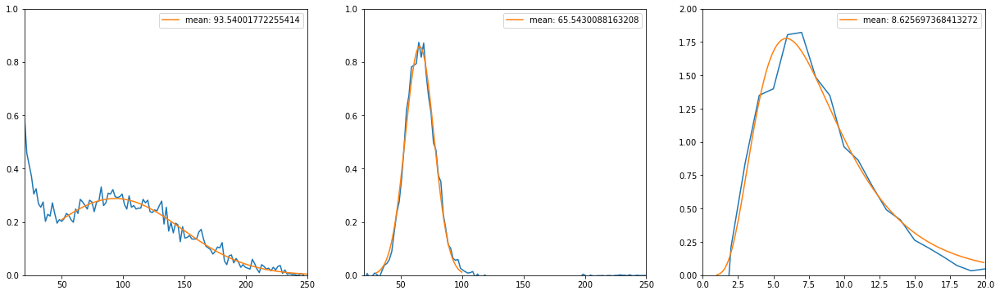

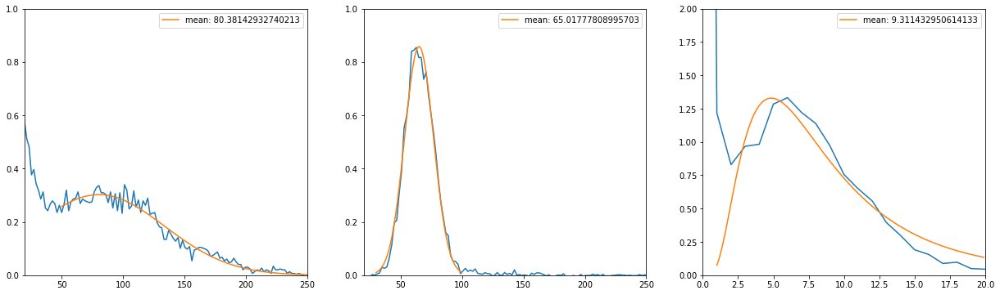

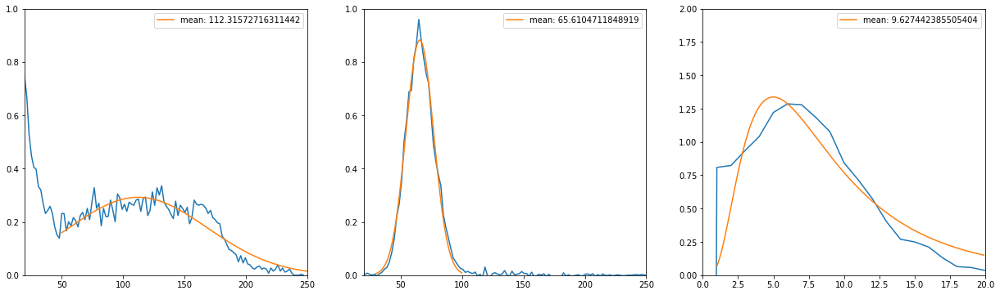

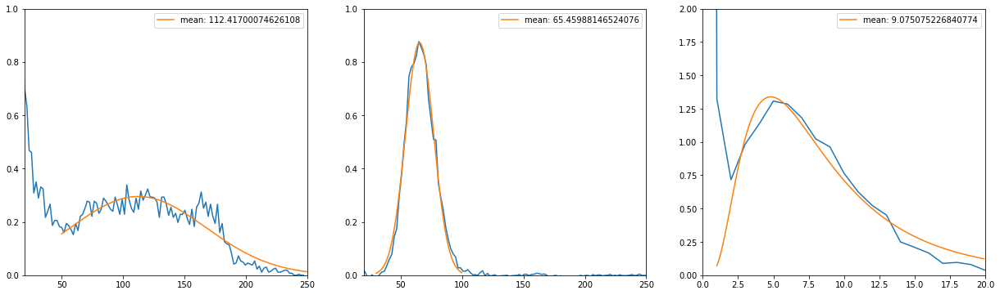

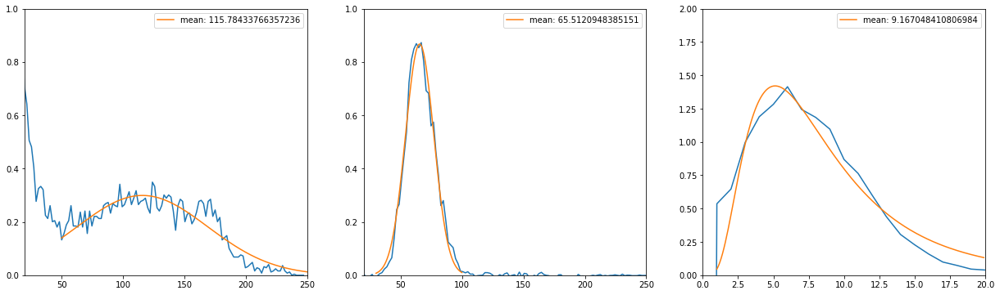

In [29]:
for field, field_fit, peak in zip(rebin_norm_data, fit_params, [fit_range_0, fit_range, fit_range, fit_range, fit_range_0]):
    
    x_source = np.arange(peak['source'][0], peak['source'][1], .1)
    x_405 = np.arange(peak[405.0][0], peak[405.0][1], .1)
    x_310 = np.arange(peak[310.0][0], peak[310.0][1], .1)
    for i in range(len(field['source']['pe_data'])):
        plt.figure(figsize=(21, 6))
        
        plt.subplot(1, 3, 1)
        plt.ylim(0, 1)
        plt.xlim(20, 250)
        plt.plot(field['source']['pe_data'][i], field['source']['counts'][i])
        plt.plot(x_source, gauss_fun(x_source, *field_fit['source'][i]), label='mean: {}'.format(field_fit['source'][i][1])) #, np.exp(-(x_source-field_fit['source'][i][0])**2/(2*field_fit['source'][i][1]**2)))#
        plt.legend()
        
        plt.subplot(1, 3, 2)
        plt.ylim(0, 1)
        plt.xlim(20, 250)
        plt.plot(field[405.0]['pe_data'][i], field[405.0]['counts'][i])
        plt.plot(x_405, gauss_fun(x_405, *field_fit[405.0][i]), label='mean: {}'.format(field_fit[405.0][i][1]))
        plt.legend()
        
        plt.subplot(1, 3, 3)
        plt.ylim(0, 2)
        plt.xlim(0, 20)
        plt.plot(field[310.0]['pe_data'][i], field[310.0]['counts'][i])
        mean = np.exp(field_fit[310.0][i][1] + field_fit[310.0][i][2]**2/2)
#         mean = field_fit[310.0][i][1] + field_fit[310.0][i][2] * (field_fit[310.0][i][3] / np.sqrt(1 + field_fit[310.0][i][3]**2)) * np.sqrt(2/np.pi)
        plt.plot(x_310, lognorm_fun(x_310, *field_fit[310.0][i]), label='mean: {}'.format(mean))#field_fit[310.0][i][1]))
        plt.legend()
        

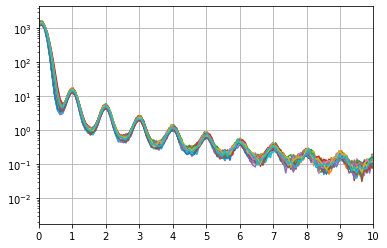

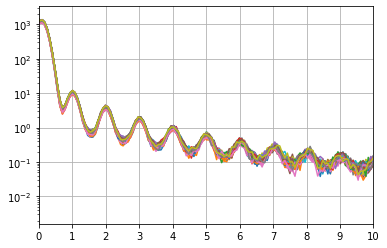

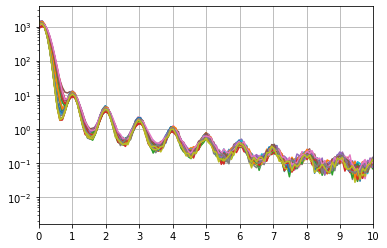

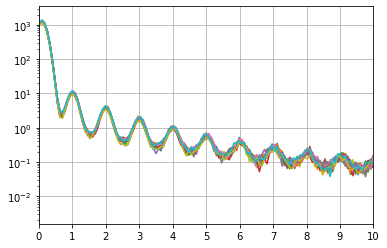

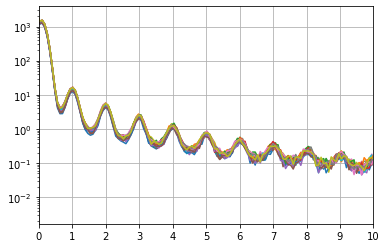

In [30]:
for field in norm_data:
    plt.figure()
    plt.grid()
    for i in range(len(field['source']['pe_data'])):
        plt.plot(field['source']['pe_data'][i], field['source']['counts'][i])
        plt.xlim(0, 10)
        plt.xticks(np.arange(0, 11, 1))
        plt.yscale('log')

In [31]:
print([data_list[i]['source']['time'] for i in range(len(data_list))])

[array([1.67941188e+09, 1.67941197e+09, 1.67941206e+09, 1.67941215e+09,
       1.67941224e+09, 1.67941233e+09, 1.67941242e+09, 1.67941251e+09,
       1.67941260e+09, 1.67941269e+09, 1.67941278e+09, 1.67941287e+09,
       1.67941296e+09, 1.67941305e+09, 1.67941314e+09, 1.67941323e+09,
       1.67941332e+09, 1.67941341e+09, 1.67941350e+09, 1.67941359e+09,
       1.67941368e+09, 1.67941377e+09, 1.67941386e+09, 1.67941395e+09,
       1.67941404e+09, 1.67941413e+09, 1.67941422e+09, 1.67941431e+09,
       1.67941440e+09, 1.67941449e+09, 1.67941458e+09, 1.67941467e+09,
       1.67941476e+09, 1.67941485e+09, 1.67941494e+09, 1.67941503e+09,
       1.67941512e+09, 1.67941521e+09, 1.67941530e+09, 1.67941539e+09]), array([1.67941589e+09, 1.67941598e+09, 1.67941607e+09, 1.67941616e+09,
       1.67941625e+09, 1.67941634e+09, 1.67941643e+09, 1.67941652e+09,
       1.67941662e+09, 1.67941671e+09, 1.67941680e+09, 1.67941689e+09,
       1.67941698e+09, 1.67941707e+09, 1.67941716e+09, 1.67941725e+09,
   

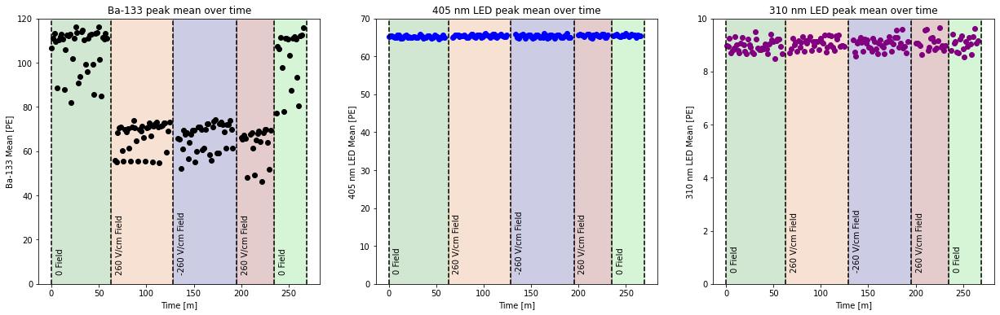

In [37]:
plt.figure(figsize=(21, 6))

plt.subplot(1, 3, 1)
zero_line = plt.vlines(0, 0, 120, colors='k', linestyles='dashed')

plt.subplot(1, 3, 2)
plt.vlines(0, 0, 120, colors='k', linestyles='dashed')

plt.subplot(1, 3, 3)
plt.vlines(0, 0, 120, colors='k', linestyles='dashed')

zero_time = data_list[0]['source']['time'][0]
for i, (field, params, color, label) in enumerate(zip(data_list, fit_params, field_colors, field_labels)):
    plt.subplot(1, 3, 1)
    means = params['source'][:,1]
    line = (field['source']['time'][:len(means)][-1] - zero_time)/60 + 4
    plt.vlines(line, 0, 120, colors='k', linestyles='dashed')
    
    if i >0:
        prev_line = (data_list[i-1]['source']['time'][:len(fit_params[i-1]['source'][:,1])][-1] - zero_time)/60 + 4
        plt.fill_betweenx([0, 120], prev_line, line, color=color, alpha=0.2)
        plt.text(prev_line+5, 5, label+' Field', rotation=90)
    else:
        plt.fill_betweenx([0, 120], 0, line,  color=color, alpha=0.2)
        plt.text(5, 5, label+' Field', rotation=90)
    
    plt.scatter((field['source']['time'][:len(means)] - zero_time)/60, means, c='k')
    plt.ylim(0, 120)
    plt.xlabel('Time [m]')
    plt.ylabel('Ba-133 Mean [PE]')
    plt.title('Ba-133 peak mean over time')
    
    plt.subplot(1, 3, 2)
    means_405 = params[405.0][:,1]
    line = (field[405.0]['time'][:len(means_405)][-1] - zero_time)/60 + 4
    plt.vlines(line, 0, 120, colors='k', linestyles='dashed')
    
    if i >0:
        prev_line = (data_list[i-1][405.0]['time'][:len(fit_params[i-1][405.0][:,1])][-1] - zero_time)/60 + 4
        plt.fill_betweenx([0, 120], prev_line, line, color=color, alpha=0.2)
        plt.text(prev_line+5, 3, label+' Field', rotation=90)
    else:
        plt.fill_betweenx([0, 120], 0, line,  color=color, alpha=0.2)
        plt.text(5, 3, label+' Field', rotation=90)
    
    plt.scatter((field[405.0]['time'][:len(means_405)] - zero_time)/60, means_405, c='b')
    plt.ylim(0, 70)
    plt.xlabel('Time [m]')
    plt.ylabel('405 nm LED Mean [PE]')
    plt.title('405 nm LED peak mean over time')
    
    plt.subplot(1, 3, 3)
#     means_310 = params[310.0][:,1] + params[310.0][:,2] * (params[310.0][:,3] / np.sqrt(1 + params[310.0][:,3]**2)) * np.sqrt(2/np.pi)
    means_310 = np.exp(params[310.0][:,1] + params[310.0][:,2]**2/2)
    line = (field[310.0]['time'][:len(means_310)][-1] - zero_time)/60 + 4
    plt.vlines(line, 0, 120, colors='k', linestyles='dashed')
    
    if i >0:
        prev_line = (data_list[i-1][310.0]['time'][:len(fit_params[i-1][310.0][:,1])][-1] - zero_time)/60 + 4
        plt.fill_betweenx([0, 120], prev_line, line, color=color, alpha=0.2)
        plt.text(prev_line+5, 0.5, label+' Field', rotation=90)
    else:
        plt.fill_betweenx([0, 120], 0, line,  color=color, alpha=0.2)
        plt.text(5, 0.5, label+' Field', rotation=90)
    
    plt.scatter((field[310.0]['time'][:len(means_310)] - zero_time)/60, means_310, c='purple')
    plt.ylim(0, 10)
    plt.xlabel('Time [m]')
    plt.ylabel('310 nm LED Mean [PE]')
    plt.title('310 nm LED peak mean over time')